Download dataset from here


https://www.kaggle.com/kandij/job-recommendation-datasets


In [2]:
import pandas as pd
import re
import numpy as np

In [2]:

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
wn = WordNetLemmatizer()

The process start by cleaning and building the datasets, then get the numerical features from data, after that we will apply a similarity function( cosine similarity for example) to get the similarity between previous user jobs or jobs which user has manifested interest and the availables jobs, finally get the top recommend jobs according to the score of the similarity.

# Building the Datasets
In every data project, the fist step is to explore and clean the data we have, also as there are 4 dataset we are going to merge them in order to have 1 dataset for jobs, and 1 dataset for users.

In [3]:
df_jobs = pd.read_csv('Combined_Jobs_Final.csv')
df_jobs.head()

,Job.ID,Provider,Status,Slug,Title,Position,Company,City,State.Name,State.Code,...,Industry,Job.Description,Requirements,Salary,Listing.Start,Listing.End,Employment.Type,Education.Required,Created.At,Updated.At
0,111,1,open,palo-alto-ca-tacolicious-server,Server @ Tacolicious,Server,Tacolicious,Palo Alto,California,CA,...,Food and Beverages,Tacolicious' first Palo Alto store just opened...,NaN,8.00,NaN,NaN,Part-Time,NaN,2013-03-12 02:08:28 UTC,2014-08-16 15:35:36 UTC
1,113,1,open,san-francisco-ca-claude-lane-kitchen-staff-chef,Kitchen Staff/Chef @ Claude Lane,Kitchen Staff/Chef,Claude Lane,San Francisco,California,CA,...,Food and Beverages,\r\n\r\nNew French Brasserie in S.F. Financia...,NaN,0.00,NaN,NaN,Part-Time,NaN,2013-04-12 08:36:36 UTC,2014-08-16 15:35:36 UTC
2,117,1,open,san-francisco-ca-machka-restaurants-corp-barte...,Bartender @ Machka Restaurants Corp.,Bartender,Machka Restaurants Corp.,San Francisco,California,CA,...,Food and Beverages,We are a popular Mediterranean wine bar and re...,NaN,11.00,NaN,NaN,Part-Time,NaN,2013-07-16 09:34:10 UTC,2014-08-16 15:35:37 UTC
3,121,1,open,brisbane-ca-teriyaki-house-server,Server @ Teriyaki House,Server,Teriyaki House,Brisbane,California,CA,...,Food and Beverages,● Serve food/drinks to customers in a profess...,NaN,10.55,NaN,NaN,Part-Time,NaN,2013-09-04 15:40:30 UTC,2014-08-16 15:35:38 UTC
4,127,1,open,los-angeles-ca-rosa-mexicano-sunset-kitchen-st...,Kitchen Staff/Chef @ Rosa Mexicano - Sunset,Kitchen Staff/Chef,Rosa Mexicano - Sunset,Los Angeles,California,CA,...,Food and Beverages,"Located at the heart of Hollywood, we are one ...",NaN,10.55,NaN,NaN,Part-Time,NaN,2013-07-17 15:26:18 UTC,2014-08-16 15:35:40 UTC


In [4]:
df_jobs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84090 entries, 0 to 84089
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Job.ID              84090 non-null  int64  
 1   Provider            84090 non-null  int64  
 2   Status              84090 non-null  object 
 3   Slug                84090 non-null  object 
 4   Title               84090 non-null  object 
 5   Position            84090 non-null  object 
 6   Company             81819 non-null  object 
 7   City                83955 non-null  object 
 8   State.Name          83919 non-null  object 
 9   State.Code          83919 non-null  object 
 10  Address             36 non-null     object 
 11  Latitude            84090 non-null  float64
 12  Longitude           84090 non-null  float64
 13  Industry            267 non-null    object 
 14  Job.Description     84034 non-null  object 
 15  Requirements        0 non-null      float64
 16  Sala

In [5]:
final_jobs = df_jobs[['Job.ID','Title','Position','Company','City','Job.Description','Employment.Type']]
final_jobs.isnull().sum()

Job.ID                0
Title                 0
Position              0
Company            2271
City                135
Job.Description      56
Employment.Type      10
dtype: int64

In [6]:
#selecting NaN rows of city
nan_city = final_jobs[pd.isnull(final_jobs['City'])]
print(nan_city.shape)
nan_city.head()

(135, 7)


,Job.ID,Title,Position,Company,City,Job.Description,Employment.Type
3425,142044,Registered Nurse (RN) @ St. Francis Hospital,Registered Nurse (RN),St. Francis Hospital,NaN,Under the direction of the Clinical Coordinato...,Full-Time/Part-Time
3433,142054,Sales Representative - Business Development Op...,Sales Representative - Business Development Op...,CHI Payment Systems,NaN,"If you&rsquo;re energetic, motivated, hardwork...",Full-Time/Part-Time
3434,142055,New Business Executive @ CHI Payment Systems,New Business Executive,CHI Payment Systems,NaN,"If you&rsquo;re energetic, motivated, hardwork...",Full-Time/Part-Time
3435,142056,Outside Sales Representative (Business Develop...,Outside Sales Representative (Business Develop...,CHI Payment Systems,NaN,"If you&rsquo;re energetic, motivated, hardwork...",Full-Time/Part-Time
3436,142057,Outside Sales Representative @ CHI Payment Sys...,Outside Sales Representative,CHI Payment Systems,NaN,"If you&rsquo;re energetic, motivated, hardwork...",Full-Time/Part-Time


In [7]:
nan_city.groupby(['Company'])['City'].count()

Company
Academic Year In America                0
CBS Healthcare Services and Staffing    0
CHI Payment Systems                     0
Driveline Retail                        0
Educational Testing Services            0
Genesis Health System                   0
Genesis Health Systems                  0
Home Instead Senior Care                0
St. Francis Hospital                    0
Volvo Group                             0
Name: City, dtype: int64

We see that there are only 9 companies cities that are having NaN values so I manually adding their head quarters with the help of google search

In [8]:
#replacing nan with thier headquarters location
final_jobs['Company'] = final_jobs['Company'].replace(['Genesis Health Systems'], 'Genesis Health System')

final_jobs['City'][final_jobs['Company'] == 'CHI Payment Systems'] = 'Illinois'
final_jobs['City'][final_jobs['Company'] == 'Academic Year In America'] = 'Stamford'
final_jobs['City'][final_jobs['Company'] == 'CBS Healthcare Services and Staffing '] = 'Urbandale'
final_jobs['City'][final_jobs['Company'] == 'Driveline Retail'] = 'Coppell'
final_jobs['City'][final_jobs['Company'] == 'Educational Testing Services'] = 'New Jersey'
final_jobs['City'][final_jobs['Company'] == 'Genesis Health System'] = 'Davennport'
final_jobs['City'][final_jobs['Company'] == 'Home Instead Senior Care'] = 'Nebraska'
final_jobs['City'][final_jobs['Company'] == 'St. Francis Hospital'] = 'New York'
final_jobs['City'][final_jobs['Company'] == 'Volvo Group'] = 'Washington'
final_jobs['City'][final_jobs['Company'] == 'CBS Healthcare Services and Staffing'] = 'Urbandale'


<ipython-input-8-bf47e4dec15c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['Company'] = final_jobs['Company'].replace(['Genesis Health Systems'], 'Genesis Health System')
<ipython-input-8-bf47e4dec15c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['City'][final_jobs['Company'] == 'CHI Payment Systems'] = 'Illinois'
C:\Users\hp\anaconda3\lib\site-packages\pandas\core\series.py:1020: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.or

# Then as part of the preprocessing we:
    
imputed the missing values if any.

remove stop words.

remove not alphanumeric characters.

lemmatize the columns.

finally we will merge all the columns in order to create a corpus of text for each job.

In [9]:
final_jobs.isnull().sum()

Job.ID                0
Title                 0
Position              0
Company            2271
City                  0
Job.Description      56
Employment.Type      10
dtype: int64

In [10]:
#The employement type NA are from Uber so I assume as part-time and full time
nan_emp_type = final_jobs[pd.isnull(final_jobs['Employment.Type'])]
nan_emp_type

,Job.ID,Title,Position,Company,City,Job.Description,Employment.Type
10768,153197,Driving Partner @ Uber,Driving Partner,Uber,San Francisco,Uber is changing the way the world moves. From...,NaN
10769,153198,Driving Partner @ Uber,Driving Partner,Uber,Los Angeles,Uber is changing the way the world moves. From...,NaN
10770,153199,Driving Partner @ Uber,Driving Partner,Uber,Chicago,Uber is changing the way the world moves. From...,NaN
10771,153200,Driving Partner @ Uber,Driving Partner,Uber,Boston,Uber is changing the way the world moves. From...,NaN
10772,153201,Driving Partner @ Uber,Driving Partner,Uber,Ann Arbor,Uber is changing the way the world moves. From...,NaN
10773,153202,Driving Partner @ Uber,Driving Partner,Uber,Oklahoma,Uber is changing the way the world moves. From...,NaN
10774,153203,Driving Partner @ Uber,Driving Partner,Uber,Omaha,Uber is changing the way the world moves. From...,NaN
10775,153204,Driving Partner @ Uber,Driving Partner,Uber,Lincoln,Uber is changing the way the world moves. From...,NaN
10776,153205,Driving Partner @ Uber,Driving Partner,Uber,Minneapolis,Uber is changing the way the world moves. From...,NaN
10777,153206,Driving Partner @ Uber,Driving Partner,Uber,St. Paul,Uber is changing the way the world moves. From...,NaN


In [11]:
#replacing na values with part time/full time
final_jobs['Employment.Type']=final_jobs['Employment.Type'].fillna('Full-Time/Part-Time')
final_jobs.groupby(['Employment.Type'])['Company'].count()
final_jobs

<ipython-input-11-c1e9626d9393>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['Employment.Type']=final_jobs['Employment.Type'].fillna('Full-Time/Part-Time')


,Job.ID,Title,Position,Company,City,Job.Description,Employment.Type
0,111,Server @ Tacolicious,Server,Tacolicious,Palo Alto,Tacolicious' first Palo Alto store just opened...,Part-Time
1,113,Kitchen Staff/Chef @ Claude Lane,Kitchen Staff/Chef,Claude Lane,San Francisco,\r\n\r\nNew French Brasserie in S.F. Financia...,Part-Time
2,117,Bartender @ Machka Restaurants Corp.,Bartender,Machka Restaurants Corp.,San Francisco,We are a popular Mediterranean wine bar and re...,Part-Time
3,121,Server @ Teriyaki House,Server,Teriyaki House,Brisbane,● Serve food/drinks to customers in a profess...,Part-Time
4,127,Kitchen Staff/Chef @ Rosa Mexicano - Sunset,Kitchen Staff/Chef,Rosa Mexicano - Sunset,Los Angeles,"Located at the heart of Hollywood, we are one ...",Part-Time
...,...,...,...,...,...,...,...
84085,82,Book Keeper @ National Japanese American Histo...,Book Keeper,National Japanese American Historical Society,San Francisco,NJAHS stands for National Japanese American Hi...,Part-Time
84086,83,Kitchen Staff/Chef @ Emporio Rulli,Kitchen Staff/Chef,Emporio Rulli,Larkspur,Weekend Brunch Line Cook \r\n● Other shifts ma...,Part-Time
84087,84,Driver @ Onigilly,Driver,Onigilly,San Francisco,ONIGILLY (Japanese rice ball wraps) seeks outg...,Part-Time
84088,88,Line Cook @ Machka Restaurants Corp.,Line Cook,Machka Restaurants Corp.,San Francisco,We are a popular Mediterranean restaurant in F...,Part-Time


In [12]:
final_jobs["text"] = final_jobs["Position"].map(str) + " " + final_jobs["Company"] +" "+ final_jobs["City"]+ " "+final_jobs['Employment.Type']+" "+final_jobs['Job.Description']
final_jobs.text.head()

<ipython-input-12-0023224fb16f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs["text"] = final_jobs["Position"].map(str) + " " + final_jobs["Company"] +" "+ final_jobs["City"]+ " "+final_jobs['Employment.Type']+" "+final_jobs['Job.Description']


0    Server Tacolicious Palo Alto Part-Time Tacolic...
1    Kitchen Staff/Chef Claude Lane San Francisco P...
2    Bartender Machka Restaurants Corp. San Francis...
3    Server Teriyaki House Brisbane Part-Time  ● Se...
4    Kitchen Staff/Chef Rosa Mexicano - Sunset Los ...
Name: text, dtype: object

In [13]:
#removing unnecessary characters between words separated by space between each word of all columns to make the data efficient
final_jobs['text'] = final_jobs['text'].str.replace('[^a-zA-Z \n\.]'," ") #removing unnecessary characters
final_jobs.text.head()

<ipython-input-13-9b972ebae871>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['text'] = final_jobs['text'].str.replace('[^a-zA-Z \n\.]'," ") #removing unnecessary characters


0    Server Tacolicious Palo Alto Part Time Tacolic...
1    Kitchen Staff Chef Claude Lane San Francisco P...
2    Bartender Machka Restaurants Corp. San Francis...
3    Server Teriyaki House Brisbane Part Time    Se...
4    Kitchen Staff Chef Rosa Mexicano   Sunset Los ...
Name: text, dtype: object

In [14]:
#converting all the characeters to lower case
final_jobs['text'] = final_jobs['text'].str.lower() 
final_jobs.text.head()

<ipython-input-14-820ed41ffeff>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_jobs['text'] = final_jobs['text'].str.lower()


0    server tacolicious palo alto part time tacolic...
1    kitchen staff chef claude lane san francisco p...
2    bartender machka restaurants corp. san francis...
3    server teriyaki house brisbane part time    se...
4    kitchen staff chef rosa mexicano   sunset los ...
Name: text, dtype: object

In [15]:
final_all = final_jobs[['Job.ID', 'text']]
# renaming the column name as it seemed a bit complicated
final_all = final_jobs[['Job.ID', 'text']]
final_all = final_all.fillna(" ")

final_all.head()

,Job.ID,text
0,111,server tacolicious palo alto part time tacolic...
1,113,kitchen staff chef claude lane san francisco p...
2,117,bartender machka restaurants corp. san francis...
3,121,server teriyaki house brisbane part time se...
4,127,kitchen staff chef rosa mexicano sunset los ...


We can import stopwords from nltk.corpus as below. With that, We exclude stopwords with Python's list comprehension and pandas.DataFrame.apply.

In [16]:
text = final_all['text']
#removing stopwords and applying potter stemming
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
stemmer =  PorterStemmer()
stop = stopwords.words('english')
only_text = text.apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
only_text.head()

0    server tacolicious palo alto part time tacolic...
1    kitchen staff chef claude lane san francisco p...
2    bartender machka restaurants corp. san francis...
3    server teriyaki house brisbane part time serve...
4    kitchen staff chef rosa mexicano sunset los an...
Name: text, dtype: object

In [17]:
only_text = only_text.apply(lambda x : filter(None,x.split(" ")))
print(only_text.head())

0    <filter object at 0x0000021992E927F0>
1    <filter object at 0x0000021992E92760>
2    <filter object at 0x0000021992E92E50>
3    <filter object at 0x0000021992E92E20>
4    <filter object at 0x0000021992E92640>
Name: text, dtype: object


Here stemming is basically used to remove the suffixes and common words that repeat and separated by commas. for y in x means, for each word(y) in the total list(x)

In [18]:
only_text = only_text.apply(lambda x : [stemmer.stem(y) for y in x])
print(only_text.head())

0    [server, tacolici, palo, alto, part, time, tac...
1    [kitchen, staff, chef, claud, lane, san, franc...
2    [bartend, machka, restaur, corp., san, francis...
3    [server, teriyaki, hous, brisban, part, time, ...
4    [kitchen, staff, chef, rosa, mexicano, sunset,...
Name: text, dtype: object


In the above code, we separated each letter in a word separated by comma, now, in this step, we join the words(x)

In [19]:
only_text = only_text.apply(lambda x : " ".join(x))
print(only_text.head())

0    server tacolici palo alto part time tacolici f...
1    kitchen staff chef claud lane san francisco pa...
2    bartend machka restaur corp. san francisco par...
3    server teriyaki hous brisban part time serv fo...
4    kitchen staff chef rosa mexicano sunset lo ang...
Name: text, dtype: object


In [20]:
#adding the featured column back to pandas
final_all['text_fin']= only_text
# As we have added a new column by performing all the operations using lambda function, we are removing the unnecessary column
#final_all = final_all.drop("pos_com_city_empType_jobDesc", 1)

list(final_all)
final_all.head()

,Job.ID,text,text_fin
0,111,server tacolicious palo alto part time tacolic...,server tacolici palo alto part time tacolici f...
1,113,kitchen staff chef claude lane san francisco p...,kitchen staff chef claud lane san francisco pa...
2,117,bartender machka restaurants corp. san francis...,bartend machka restaur corp. san francisco par...
3,121,server teriyaki house brisbane part time se...,server teriyaki hous brisban part time serv fo...
4,127,kitchen staff chef rosa mexicano sunset los ...,kitchen staff chef rosa mexicano sunset lo ang...


In [22]:
final_all['title'] = df_jobs[['Title']]
final_all

,Job.ID,text,text_fin,title
0,111,server tacolicious palo alto part time tacolic...,server tacolici palo alto part time tacolici f...,Server @ Tacolicious
1,113,kitchen staff chef claude lane san francisco p...,kitchen staff chef claud lane san francisco pa...,Kitchen Staff/Chef @ Claude Lane
2,117,bartender machka restaurants corp. san francis...,bartend machka restaur corp. san francisco par...,Bartender @ Machka Restaurants Corp.
3,121,server teriyaki house brisbane part time se...,server teriyaki hous brisban part time serv fo...,Server @ Teriyaki House
4,127,kitchen staff chef rosa mexicano sunset los ...,kitchen staff chef rosa mexicano sunset lo ang...,Kitchen Staff/Chef @ Rosa Mexicano - Sunset
...,...,...,...,...
84085,82,book keeper national japanese american histori...,book keeper nation japanes american histor soc...,Book Keeper @ National Japanese American Histo...
84086,83,kitchen staff chef emporio rulli larkspur part...,kitchen staff chef emporio rulli larkspur part...,Kitchen Staff/Chef @ Emporio Rulli
84087,84,driver onigilly san francisco part time onigil...,driver onigilli san francisco part time onigil...,Driver @ Onigilly
84088,88,line cook machka restaurants corp. san francis...,line cook machka restaur corp. san francisco p...,Line Cook @ Machka Restaurants Corp.


# TF-IDF ( Term Frequency - Inverse Document Frequency )
This method is also called as Normalization. TF - How many times a particular word appears in a single doc. IDF - This downscales words that appear a lot across documents.

In [23]:
#initializing tfidf vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.feature_extraction.text import CountVectorizer

tfidf_vectorizer = TfidfVectorizer()

tfidf_jobid = tfidf_vectorizer.fit_transform((final_all['text_fin'])) #fitting and transforming the vector
tfidf_jobid

<84090x49363 sparse matrix of type '<class 'numpy.float64'>'
	with 8260550 stored elements in Compressed Sparse Row format>

In [24]:
#Consider a  new data set and  taking the datasets job view, position of interest, experience of the applicant into consideration for creating a query who applied for job
job_view = pd.read_csv("Job_Views.csv")
job_view.head()

,Applicant.ID,Job.ID,Title,Position,Company,City,State.Name,State.Code,Industry,View.Start,View.End,View.Duration,Created.At,Updated.At
0,10000,73666,Cashiers & Valets Needed! @ WallyPark,Cashiers & Valets Needed!,WallyPark,Newark,New Jersey,NJ,NaN,2014-12-12 20:12:35 UTC,2014-12-12 20:31:24 UTC,1129.0,2014-12-12 20:12:35 UTC,2014-12-12 20:12:35 UTC
1,10000,96655,Macy's Seasonal Retail Fragrance Cashier - Ga...,Macy's Seasonal Retail Fragrance Cashier - Ga...,Macy's,Garden City,New York,NY,NaN,2014-12-12 20:08:50 UTC,2014-12-12 20:10:15 UTC,84.0,2014-12-12 20:08:50 UTC,2014-12-12 20:08:50 UTC
2,10001,84141,Part Time Showroom Sales / Cashier @ Grizzly I...,Part Time Showroom Sales / Cashier,Grizzly Industrial Inc.,Bellingham,Washington,WA,NaN,2014-12-12 20:12:32 UTC,2014-12-12 20:17:18 UTC,286.0,2014-12-12 20:12:32 UTC,2014-12-12 20:12:32 UTC
3,10002,77989,Event Specialist Part Time @ Advantage Sales &...,Event Specialist Part Time,Advantage Sales & Marketing,Simpsonville,South Carolina,SC,NaN,2014-12-12 20:39:23 UTC,2014-12-12 20:42:13 UTC,170.0,2014-12-12 20:39:23 UTC,2014-12-12 20:39:23 UTC
4,10002,69568,Bonefish - Kitchen Staff @ Bonefish Grill,Bonefish - Kitchen Staff,Bonefish Grill,Greenville,South Carolina,SC,NaN,2014-12-12 20:43:25 UTC,2014-12-12 20:43:58 UTC,33.0,2014-12-12 20:43:25 UTC,2014-12-12 20:43:25 UTC


In [25]:
#subsetting only needed columns and not considering the columns that are not necessary as we did that earlier.
job_view = job_view[['Applicant.ID', 'Job.ID', 'Position', 'Company','City']]

job_view["pos_com_city"] = job_view["Position"].map(str) + "  " + job_view["Company"] +"  "+ job_view["City"]

job_view['pos_com_city'] = job_view['pos_com_city'].str.replace('[^a-zA-Z \n\.]',"")

job_view['pos_com_city'] = job_view['pos_com_city'].str.lower()

job_view = job_view[['Applicant.ID','pos_com_city']]

job_view.head()

,Applicant.ID,pos_com_city
0,10000,cashiers valets needed wallypark newark
1,10000,macys seasonal retail fragrance cashier gard...
2,10001,part time showroom sales cashier grizzly ind...
3,10002,event specialist part time advantage sales m...
4,10002,bonefish kitchen staff bonefish grill green...


In [26]:
#Experience
exper_applicant = pd.read_csv("Experience.csv")
exper_applicant.head()

,Applicant.ID,Position.Name,Employer.Name,City,State.Name,State.Code,Start.Date,End.Date,Job.Description,Salary,Can.Contact.Employer,Created.At,Updated.At
0,10001,Account Manager / Sales Administration / Quali...,Barcode Resourcing,Bellingham,Washington,WA,2012-10-15,NaN,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
1,10001,Electronics Technician / Item Master Controller,Ryzex Group,Bellingham,Washington,WA,2001-12-01,2012-04-01,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
2,10001,Machine Operator,comptec inc,Custer,Washington,WA,1997-01-01,1999-01-01,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
3,10003,maintenance technician,Winn residental,washington,District of Columbia,DC,NaN,NaN,"Necessary maintenance for ""Make Ready"" Plumbin...",10.0,False,2014-12-12 21:27:05 UTC,2014-12-12 21:27:05 UTC
4,10003,Electrical Helper,michael and son services,alexandria,Virginia,VA,NaN,NaN,repair and services of electrical construction,NaN,False,2014-12-12 21:27:05 UTC,2014-12-12 21:27:05 UTC


In [27]:
#taking only Position
exper_applicant = exper_applicant[['Applicant.ID','Position.Name']]

#cleaning the text
exper_applicant['Position.Name'] = exper_applicant['Position.Name'].str.replace('[^a-zA-Z \n\.]',"")

exper_applicant.head()
#list(exper_applicant)

,Applicant.ID,Position.Name
0,10001,Account Manager Sales Administration Quality...
1,10001,Electronics Technician Item Master Controller
2,10001,Machine Operator
3,10003,maintenance technician
4,10003,Electrical Helper


In [28]:
exper_applicant['Position.Name'] = exper_applicant['Position.Name'].str.lower()
exper_applicant.head(10)

,Applicant.ID,Position.Name
0,10001,account manager sales administration quality...
1,10001,electronics technician item master controller
2,10001,machine operator
3,10003,maintenance technician
4,10003,electrical helper
5,10003,technician
6,10004,NaN
7,10004,NaN
8,10004,shift superviveur
9,10005,all star houseman


In [29]:
exper_applicant['Position.Name'] = exper_applicant['Position.Name'].str.lower()
exper_applicant.head(10)

,Applicant.ID,Position.Name
0,10001,account manager sales administration quality...
1,10001,electronics technician item master controller
2,10001,machine operator
3,10003,maintenance technician
4,10003,electrical helper
5,10003,technician
6,10004,NaN
7,10004,NaN
8,10004,shift superviveur
9,10005,all star houseman


In [30]:
exper_applicant =  exper_applicant.sort_values(by='Applicant.ID')
exper_applicant = exper_applicant.fillna(" ")
exper_applicant.head(20)

,Applicant.ID,Position.Name
2763,2,volunteer
2762,2,writer for the uloop blog
3759,3,marketing intern
3758,3,server
3757,3,prep cook
6277,6,project assistant
7490,8,deli clerkserver cashier food prep order taker
368,11,cashier
809,12,server
810,12,rec leader


same applicant has 3 applications 100001 in sigle line

In [31]:
#adding same rows to a single row
exper_applicant = exper_applicant.groupby('Applicant.ID', sort=False)['Position.Name'].apply(' '.join).reset_index()
exper_applicant.head(20)

,Applicant.ID,Position.Name
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier
5,12,server rec leader it program management intern
6,13,offica assistant cashier assistant
7,14,waitress host lifeguard
8,15,
9,18,baristacashier server receptionist


In [32]:
#Position of interest
poi =  pd.read_csv("Positions_Of_Interest.csv", sep=',')
poi = poi.sort_values(by='Applicant.ID')
poi.head()

,Applicant.ID,Position.Of.Interest,Created.At,Updated.At
6437,96,Server,2014-08-14 15:56:42 UTC,2015-02-26 20:35:12 UTC
1156,153,Barista,2014-08-14 15:56:43 UTC,2015-02-18 02:35:06 UTC
1155,153,Host,2014-08-14 15:56:42 UTC,2015-02-26 20:35:12 UTC
1154,153,Server,2014-08-14 15:56:42 UTC,2015-02-26 20:35:12 UTC
1158,153,Sales Rep,2014-08-14 15:56:47 UTC,2015-03-02 02:13:08 UTC


In [33]:
# There is no need of application and updation becuase there is no deadline mentioned in the website ( assumption) hence we are droping unimportant attributes
poi = poi.drop('Updated.At', 1)
poi = poi.drop('Created.At', 1)

#cleaning the text
poi['Position.Of.Interest']=poi['Position.Of.Interest'].str.replace('[^a-zA-z \n\.]',"")
poi['Position.Of.Interest']=poi['Position.Of.Interest'].str.lower()
poi = poi.fillna(" ")
poi.head(20)

,Applicant.ID,Position.Of.Interest
6437,96,server
1156,153,barista
1155,153,host
1154,153,server
1158,153,sales rep
1157,153,customer service rep
1952,256,host
1957,256,production area
1956,256,sales rep
1955,256,customer service rep


In [34]:
poi = poi.groupby('Applicant.ID', sort=True)['Position.Of.Interest'].apply(' '.join).reset_index()
poi.head()

,Applicant.ID,Position.Of.Interest
0,96,server
1,153,barista host server sales rep customer service...
2,256,host production area sales rep customer servic...
3,438,customer service rep barista host server
4,568,receptionist customer service rep book keeper


In [35]:
#merging jobs and experience dataframes
out_joint_jobs = job_view.merge(exper_applicant, left_on='Applicant.ID', right_on='Applicant.ID', how='outer')
print(out_joint_jobs.shape)
out_joint_jobs = out_joint_jobs.fillna(' ')
out_joint_jobs = out_joint_jobs.sort_values(by='Applicant.ID')
out_joint_jobs.head()

(15383, 3)


,Applicant.ID,pos_com_city,Position.Name
12370,2,,volunteer writer for the uloop blog
12371,3,,marketing intern server prep cook
12372,6,,project assistant
12373,8,,deli clerkserver cashier food prep order taker
12374,11,,cashier


In [36]:
#merging position of interest with existing dataframe
joint_poi_exper_view = out_joint_jobs.merge(poi, left_on='Applicant.ID', right_on='Applicant.ID', how='outer')
joint_poi_exper_view = joint_poi_exper_view.fillna(' ')
joint_poi_exper_view = joint_poi_exper_view.sort_values(by='Applicant.ID')
joint_poi_exper_view.head()

,Applicant.ID,pos_com_city,Position.Name,Position.Of.Interest
0,2,,volunteer writer for the uloop blog,
1,3,,marketing intern server prep cook,
2,6,,project assistant,
3,8,,deli clerkserver cashier food prep order taker,
4,11,,cashier,


In [37]:
#combining all the columns

joint_poi_exper_view["pos_com_city1"] = joint_poi_exper_view["pos_com_city"].map(str) + joint_poi_exper_view["Position.Name"] +" "+ joint_poi_exper_view["Position.Of.Interest"]

joint_poi_exper_view.head()

,Applicant.ID,pos_com_city,Position.Name,Position.Of.Interest,pos_com_city1
0,2,,volunteer writer for the uloop blog,,volunteer writer for the uloop blog
1,3,,marketing intern server prep cook,,marketing intern server prep cook
2,6,,project assistant,,project assistant
3,8,,deli clerkserver cashier food prep order taker,,deli clerkserver cashier food prep order taker
4,11,,cashier,,cashier


In [38]:
final_poi_exper_view = joint_poi_exper_view[['Applicant.ID','pos_com_city1']]
final_poi_exper_view.head()

,Applicant.ID,pos_com_city1
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


In [39]:
final_poi_exper_view.columns = ['Applicant_id','text']
final_poi_exper_view.head()

,Applicant_id,text
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


In [40]:
final_poi_exper_view = final_poi_exper_view.sort_values(by='Applicant_id')
final_poi_exper_view.head()

,Applicant_id,text
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


In [41]:
final_poi_exper_view['text'] = final_poi_exper_view['text'].str.replace('[^a-zA-Z \n\.]',"")
final_poi_exper_view.head()

,Applicant_id,text
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


In [42]:
final_poi_exper_view['text'] = final_poi_exper_view['text'].str.lower()
final_poi_exper_view.head()

,Applicant_id,text
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


In [43]:
final_poi_exper_view = final_poi_exper_view.reset_index(drop=True)
final_poi_exper_view.head()

,Applicant_id,text
0,2,volunteer writer for the uloop blog
1,3,marketing intern server prep cook
2,6,project assistant
3,8,deli clerkserver cashier food prep order taker
4,11,cashier


# by TF_IDF method

In [72]:
#taking a user
u = 6945
index = np.where(final_poi_exper_view['Applicant_id'] == u)[0][0]
user_q = final_poi_exper_view.iloc[[index]]
user_q

,Applicant_id,text
3423,6945,parttime language instructor castilian spanis...


In [73]:
#creating tf-idf of user query and computing cosine similarity of user with job corpus
from sklearn.metrics.pairwise import cosine_similarity
user_tfidf = tfidf_vectorizer.transform(user_q['text'])
output = map(lambda x: cosine_similarity(user_tfidf, x),tfidf_jobid)

In [46]:
output2 = list(output)

### Function to get the top-N recomendations order by score

In [49]:
def get_recommendation(top, df_all, scores):
    recommendation = pd.DataFrame(columns = ['ApplicantID', 'JobID',  'title', 'score'])
    count = 0
    for i in top:
        recommendation.at[count, 'ApplicantID'] = u
        recommendation.at[count, 'JobID'] = df_all['Job.ID'][i]
        recommendation.at[count, 'title'] = df_all['title'][i]
        recommendation.at[count, 'score'] = scores[count]
        count += 1
    return recommendation

In [50]:
top = sorted(range(len(output2)), key=lambda i: output2[i], reverse=True)[:10]
list_scores = [output2[i][0][0] for i in top]
get_recommendation(top,final_all, list_scores)

,ApplicantID,JobID,title,score
0,6945,276248,Part-time Language Instructor - Italian (Teach...,0.242263
1,6945,287245,Part-time Book Keeper @ Career Personnel Servi...,0.240205
2,6945,263829,Part-time Language Instructor - Spanish (Teach...,0.225984
3,6945,137041,Part-time Language Instructor - Spanish (Teach...,0.217854
4,6945,253624,Part-time Language Instructor - Spanish (Teach...,0.21768
5,6945,251364,Part-time Language Instructor - English (Teach...,0.211545
6,6945,311545,Part-time Language Instructor - English (Teach...,0.211492
7,6945,289325,Part-time Language Instructor - English (Teach...,0.211469
8,6945,279665,Part-time Language Instructor - Croatian (Teac...,0.211285
9,6945,283322,Part-time Language Instructor - English (Teach...,0.211207


# COUNT_VECTORIZER

In [53]:
from sklearn.feature_extraction.text import CountVectorizer
count_vectorizer = CountVectorizer()
count_jobid = count_vectorizer.fit_transform((final_all['text'])) #fitting and transforming the vector\n",
count_jobid

<84090x55907 sparse matrix of type '<class 'numpy.int64'>'
	with 10642064 stored elements in Compressed Sparse Row format>

In [54]:
from sklearn.metrics.pairwise import cosine_similarity
user_count = count_vectorizer.transform(user_q['text'])
cos_similarity_countv = map(lambda x: cosine_similarity(user_count, x),count_jobid)

In [55]:
output2_count = list(cos_similarity_countv)

In [58]:
top = sorted(range(len(output2)), key=lambda i: output2[i], reverse=True)[:10]
list_scores = [output2_count[i][0][0] for i in top]
get_recommendation(top, final_all, list_scores)

,ApplicantID,JobID,title,score
0,6945,276248,Part-time Language Instructor - Italian (Teach...,0.243878
1,6945,287245,Part-time Book Keeper @ Career Personnel Servi...,0.212598
2,6945,263829,Part-time Language Instructor - Spanish (Teach...,0.240879
3,6945,137041,Part-time Language Instructor - Spanish (Teach...,0.245728
4,6945,253624,Part-time Language Instructor - Spanish (Teach...,0.245671
5,6945,251364,Part-time Language Instructor - English (Teach...,0.24134
6,6945,311545,Part-time Language Instructor - English (Teach...,0.24134
7,6945,289325,Part-time Language Instructor - English (Teach...,0.24134
8,6945,279665,Part-time Language Instructor - Croatian (Teac...,0.236193
9,6945,283322,Part-time Language Instructor - English (Teach...,0.24134


In [61]:
import spacy

In [62]:
!python -m spacy download en_core_web_lg

2021-06-24 22:45:09.482111: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2021-06-24 22:45:09.482146: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.



[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [64]:
nlp = spacy.load("en_core_web_lg")

In [66]:
list_docs = []
for i in range(len(final_all)):
    doc = nlp("u'" + final_all['text_fin'][i] + "'")
    list_docs.append((doc,i))
print(len(list_docs))

KeyboardInterrupt: 

In [ ]:
def calculateSimWithSpaCy(nlp, df, user_text, n=6):
            # Calculate similarity using spaCy
            list_sim =[]
            doc1 = nlp("u'" + user_text + "'")
            for i in df.index:
                try:
                    doc2 = list_docs[i][0]
                    score = doc1.similarity(doc2)
                    list_sim.append((doc1, doc2, list_docs[i][1],score))
                except:
                    continue
    return  list_sim 

# USING KNN

In [74]:
from sklearn.neighbors import NearestNeighbors
n_neighbors = 11
KNN = NearestNeighbors(n_neighbors, p=2)
KNN.fit(tfidf_jobid)
NNs = KNN.kneighbors(user_tfidf, return_distance=True)

C:\Users\hp\anaconda3\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass n_neighbors=11 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "


In [78]:
NNs[0][0][1:]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [80]:
top = NNs[1][0][1:]
index_score = NNs[0][0][1:]
get_recommendation(top, final_all, index_score)

,ApplicantID,JobID,title,score
0,6945,255363,Family Nurse Practitioner,1
1,6945,255536,Automotive Technicians Needed!,1
2,6945,255525,Administrative Assistant,1
3,6945,255519,Resident Assistant,1
4,6945,255490,Sterile Processing Technician,1
5,6945,255440,"RN ""Registered Nurse""",1
6,6945,255439,Bonefish - Kitchen Staff,1
7,6945,255400,Dining Assistant/Dietary Aide,1
8,6945,255559,Seasonal Merchandiser – Eastern North Carolina...,1
9,6945,255023,Career Fair,1


# build a custom wordcloud

In [81]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [85]:
bunch_text = " ".join(text for text in final_all.tail(10000).text_fin)

In [86]:
bunch_text

'occup therapist cpnj livingston full time part time nbsp summari nbsp plan monitor execut therapi accord need individu student implement treatment program document support educ activities. locat horizon lower school livingston nj report princip duti middot conduct ongo inform assess interpret analyz data provid written report document progress clear concis manner. middot develop educ relev iep goal object collabor teachers.. middot develop implement monitor revis therapi program individu group treatment sessions. middot submit written report appropri sourc accord schedul util requir format form maintain servic relat records. middot particip cooper aquat hippotherapi program applic plan schedul therapeut treatment individu groups. middot design fabric adjust make minor repair therapeut equip individu student suggest monitor provis appropri assist technology. middot overse activ therapi assist therapi aid therapi student cosign document accord disciplin specif practic standard licens re

In [96]:
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="pink", colormap= "magma").generate(bunch_text)

In [97]:
import matplotlib.pyplot as plt

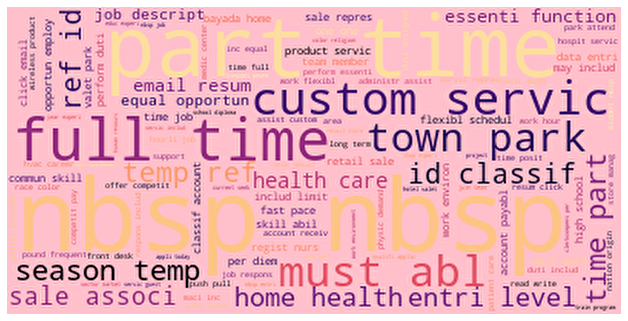

In [98]:
plt.figure(figsize=[11,11])
plt.imshow(wordcloud, interpolation="sinc")
plt.axis("off")
plt.show()